In [68]:
# Import Libraries
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from datetime import datetime
import calendar
import csv

In [2]:
# Load csv File
df = {'id': [], 'time': [], 'gl': []}

with open('Anderson2016_processed.csv') as file:
    reader = csv.reader(file, delimiter=',')
    for row in reader:
        # check for NAs
        if 'NA' in row:
            continue
        
        if row[0] == 'id': # exclude row with column names
            continue
            
        df['id'].append(row[0]) # add current row's id
        dt = datetime.strptime(row[1], '%Y-%m-%d %H:%M:%S') # convert timestamps to datetime format so graphs dont break
        df['time'].append(dt)
        df['gl'].append(float(row[2])) # Convert glucose levels to floats

df = pd.DataFrame(df)
df

,id,time,gl
0,1,2013-09-29 17:36:48,194.0
1,1,2013-09-29 17:41:48,204.0
2,1,2013-09-29 17:46:48,201.0
3,1,2013-09-29 17:51:48,204.0
4,1,2013-09-29 17:56:48,200.0
...,...,...,...
1302451,20,2014-06-01 12:53:08,144.0
1302452,20,2014-06-01 12:58:09,143.0
1302453,20,2014-06-01 13:03:08,143.0
1302454,20,2014-06-01 13:08:08,140.0


In [37]:
# sort by time
sorted_df = pd.DataFrame(df.sort_values(by = ["time"])).reset_index()
sorted_df

,index,id,time,gl
0,697379,30,2011-12-23 08:26:11,112.0
1,697380,30,2011-12-23 08:30:56,111.0
2,697381,30,2011-12-23 08:35:56,112.0
3,697382,30,2011-12-23 08:40:56,117.0
4,697383,30,2011-12-23 08:45:56,124.0
...,...,...,...,...
1302451,1270139,7,2015-06-30 12:39:21,191.0
1302452,1270140,7,2015-06-30 12:44:21,187.0
1302453,1270141,7,2015-06-30 12:49:21,183.0
1302454,1270142,7,2015-06-30 12:54:21,182.0


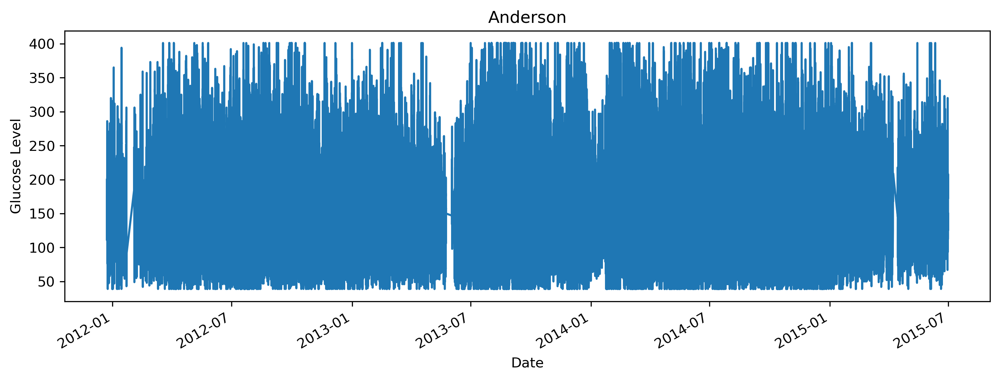

In [38]:
# Raw plot of sort by time
x = sorted_df.time
y = sorted_df.gl

fig, ax = plt.subplots(figsize = (12,4), dpi = 300)
ax.plot(x, y)
plt.title("Anderson")
plt.xlabel("Date")
plt.ylabel("Glucose Level")

fig.autofmt_xdate() # slant x-axis
plt.show()

In [57]:
# group by day
dates = []
for time in sorted_df.time:
    if [time.day, time.month, time.year] not in dates:
        dates.append([time.day, time.month, time.year])

In [58]:
# get segments by month
segments = []
group = {'id': [], 'time': [], 'gl': []}

i = 0
for date in dates:
    while i < len(sorted_df):
        if sorted_df.time[i].day == date[0] and sorted_df.time[i].month == date[1] and sorted_df.time[i].year == date[2]:
            group['id'].append(sorted_df.id[i])
            group['time'].append(sorted_df.time[i])
            group['gl'].append(sorted_df.gl[i])
        else:
            break
        i += 1
    
    segments.append(pd.DataFrame(group).reset_index())
    group = {'id': [], 'time': [], 'gl': []}

print(segments)

[     index  id                time     gl
0        0  30 2011-12-23 08:26:11  112.0
1        1  30 2011-12-23 08:30:56  111.0
2        2  30 2011-12-23 08:35:56  112.0
3        3  30 2011-12-23 08:40:56  117.0
4        4  30 2011-12-23 08:45:56  124.0
..     ...  ..                 ...    ...
179    179  30 2011-12-23 23:35:53  180.0
180    180  30 2011-12-23 23:40:53  180.0
181    181  30 2011-12-23 23:45:52  182.0
182    182  30 2011-12-23 23:50:52  183.0
183    183  30 2011-12-23 23:55:52  182.0

[184 rows x 4 columns],      index  id                time     gl
0        0  30 2011-12-24 00:00:52  182.0
1        1  30 2011-12-24 00:05:52  182.0
2        2  30 2011-12-24 00:10:52  182.0
3        3  30 2011-12-24 00:15:52  182.0
4        4  30 2011-12-24 00:20:52  182.0
..     ...  ..                 ...    ...
224    224  30 2011-12-24 23:30:47  215.0
225    225  30 2011-12-24 23:40:47  198.0
226    226  30 2011-12-24 23:45:47  189.0
227    227  30 2011-12-24 23:50:47  188.0
228    2

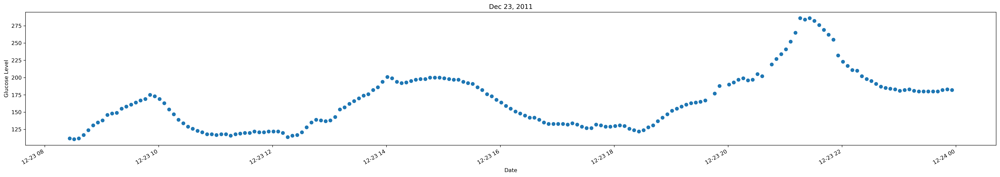

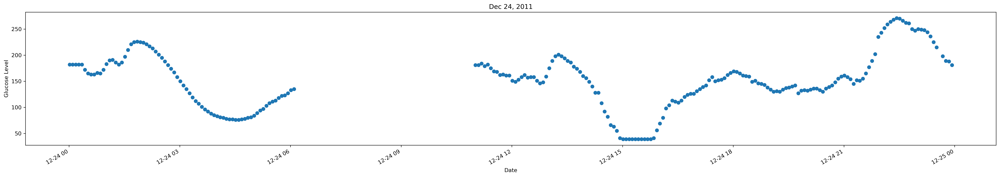

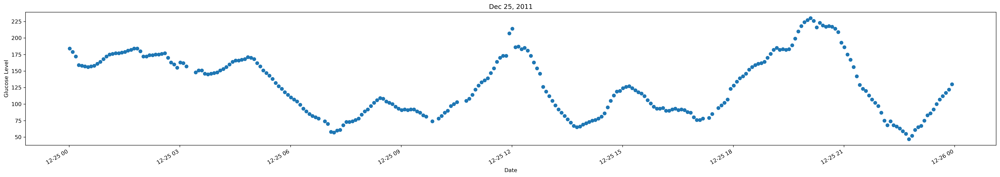

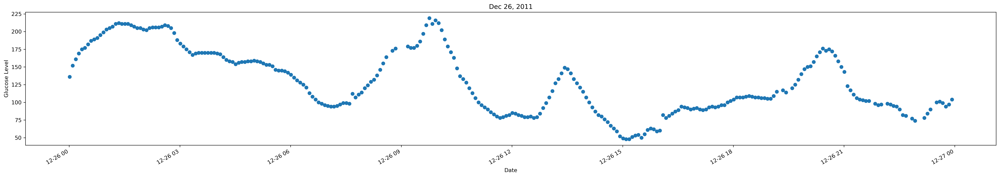

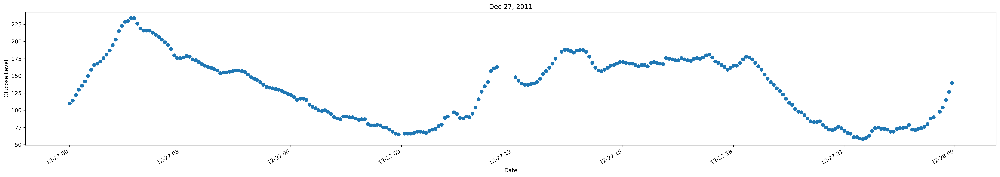

...

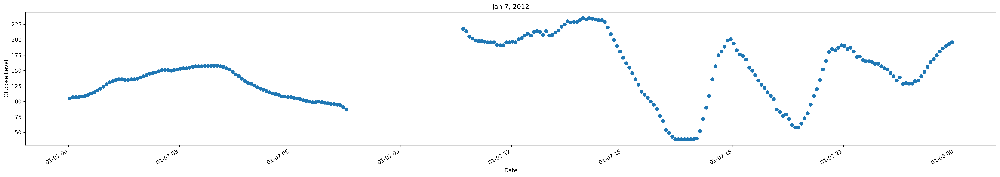

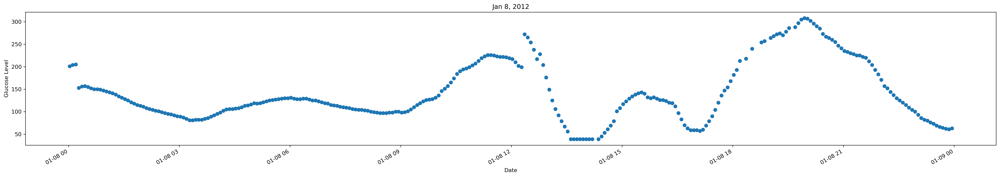

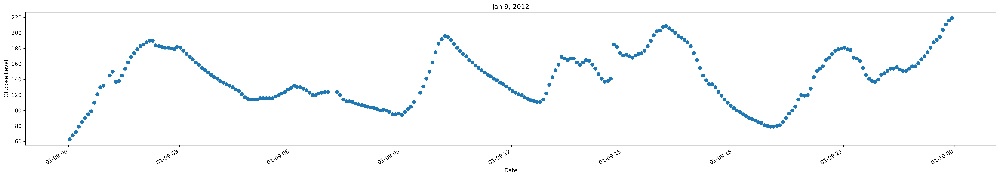

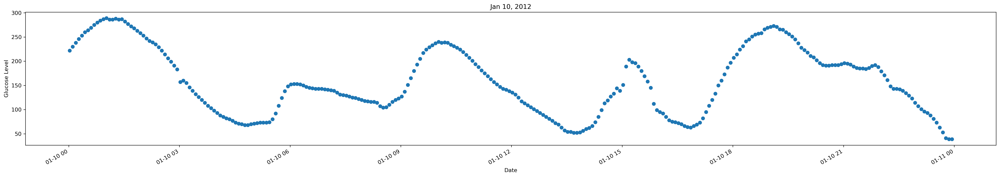

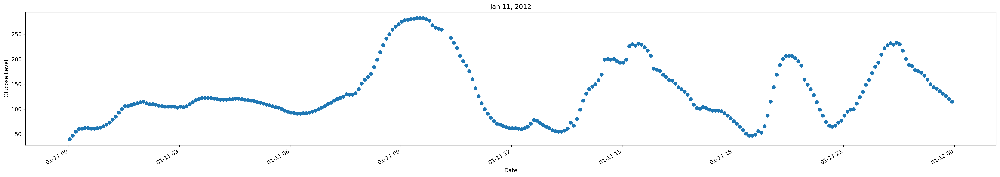

In [ ]:
# Plot same month segment
for segment in segments:
    x = segment.time
    y = segment.gl
    
    fig, ax = plt.subplots(figsize = (32,5), dpi = 300)
    ax.plot_date(x, y)
    plt.title(f"{segment['time'][0].strftime('%b')} {segment.time[0].day}, {segment.time[0].year}")
    plt.xlabel("Date")
    plt.ylabel("Glucose Level")
    
    fig.autofmt_xdate() # slant x-axis
    plt.show()

In [12]:
# Grouping data by ID
IDs = []
for ID in df.id:
    if ID not in IDs:
        IDs.append(ID)

# Group Subject Data
subj_data = dict()
for ID in IDs:
    subj_data[ID] = df.loc[df['id'] == ID].reset_index()

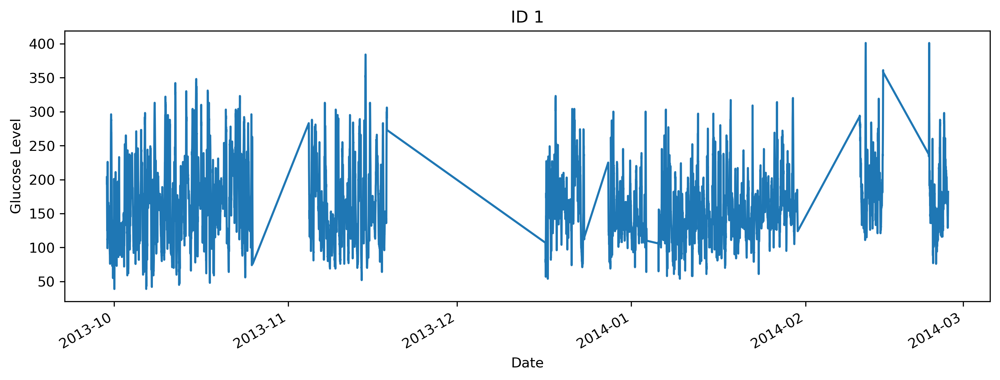

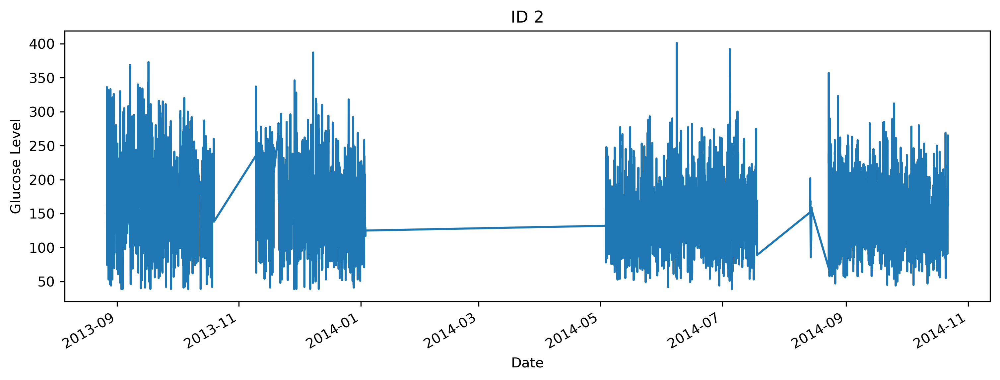

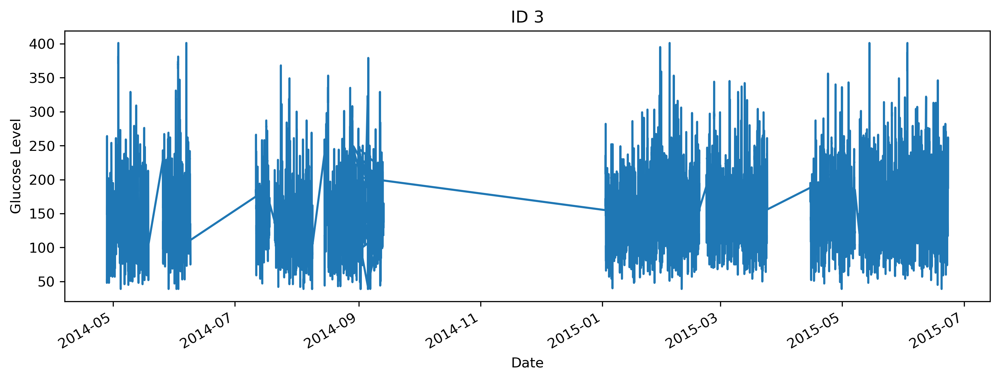

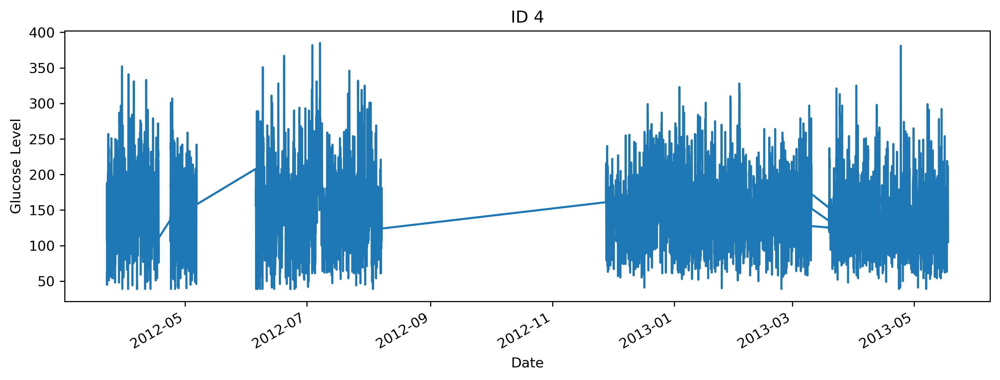

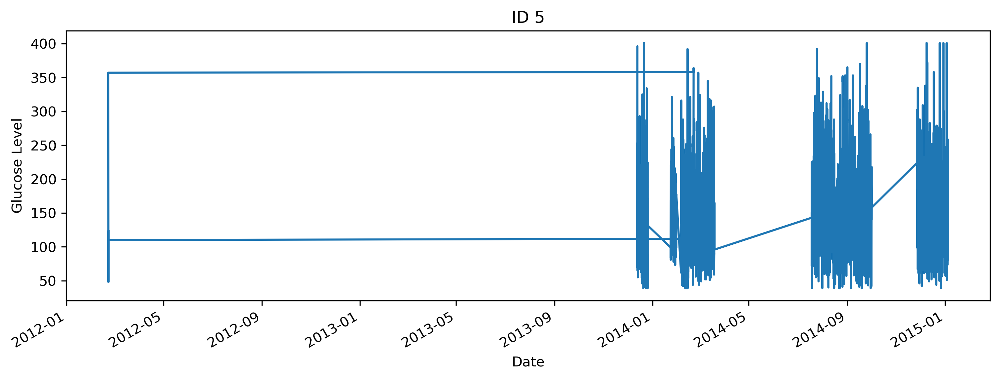

...

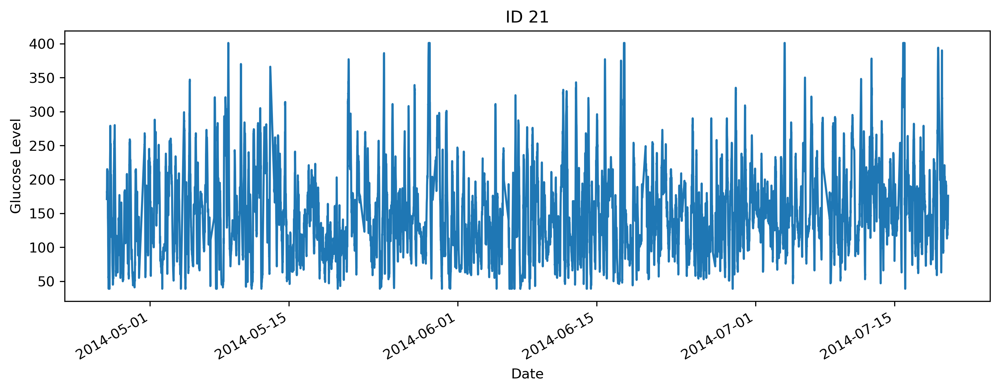

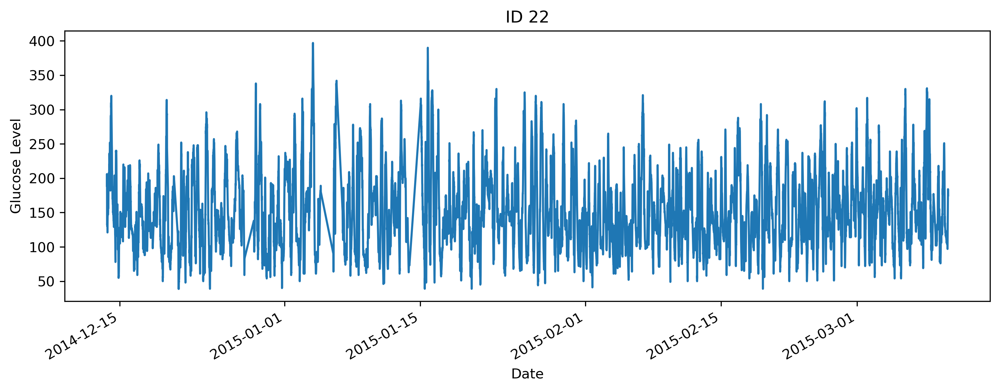

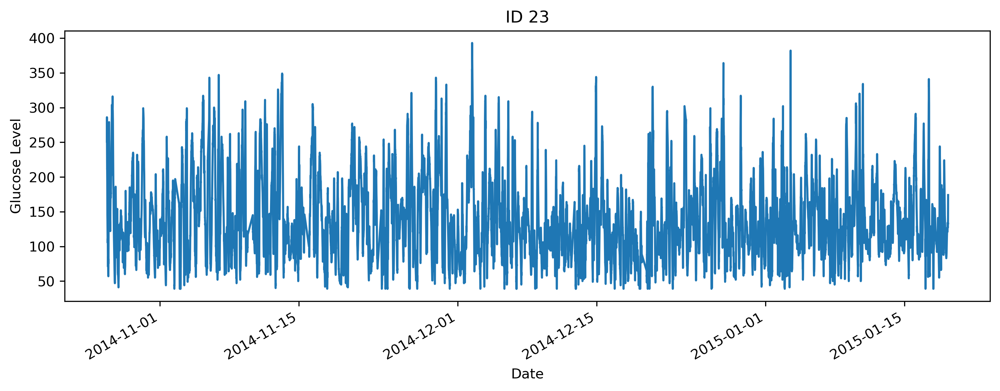

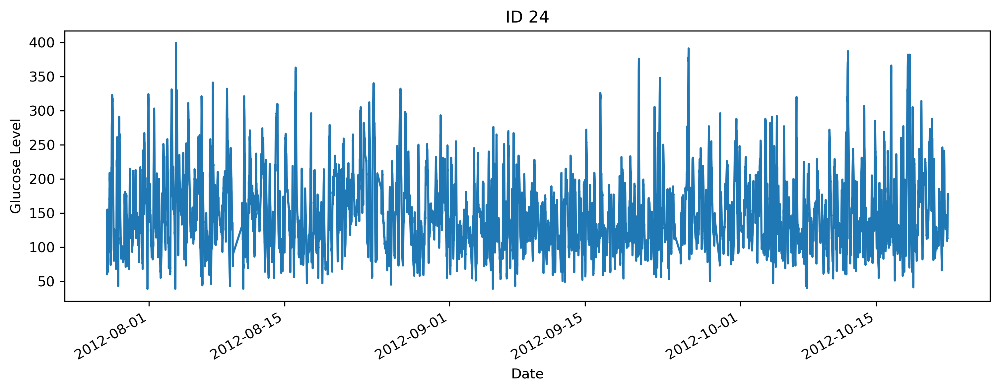

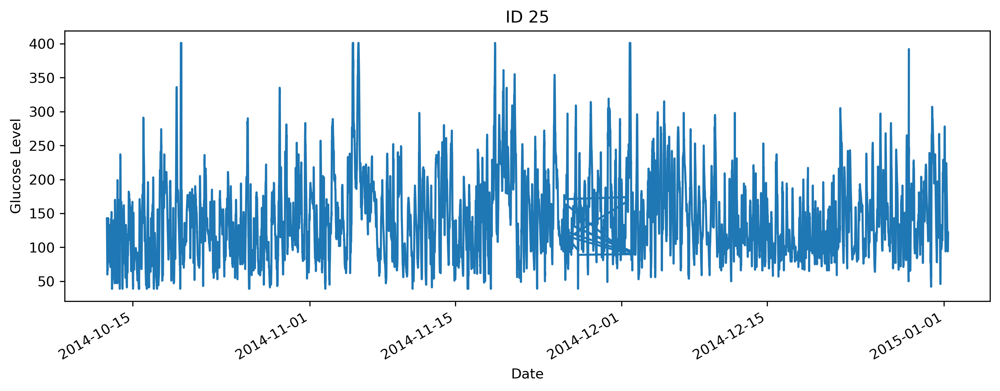

In [14]:
# Plot by ID
for ID in IDs:
    x = subj_data[ID].time # Time for x-axis
    y = subj_data[ID].gl # Glucose for y-axis

    fig, ax = plt.subplots(figsize = (12,4), dpi = 300)
    ax.plot(x, y)
    plt.title("ID " + ID)
    plt.xlabel("Date")
    plt.ylabel("Glucose Level")
    
    fig.autofmt_xdate() # slant x-axis
    plt.show()